### Clip frames from video

In [ ]:
from screenshot import take_screen_shots
download_video(download_path="data/")
take_screen_shots(video_path="data/calibration.mp4",
                  output_path="data/calibration_images",
                  interval=1,
                  start_second=0,
                  end_second=30)

### Get Chessboard Coordinates
- `objpoints` stores 3d coordinates of chessboard corners in real world
- `imgpoints` stores 2d coordinates of chessboard corners in image plane
- Chessboard annotations are plotted for checking 

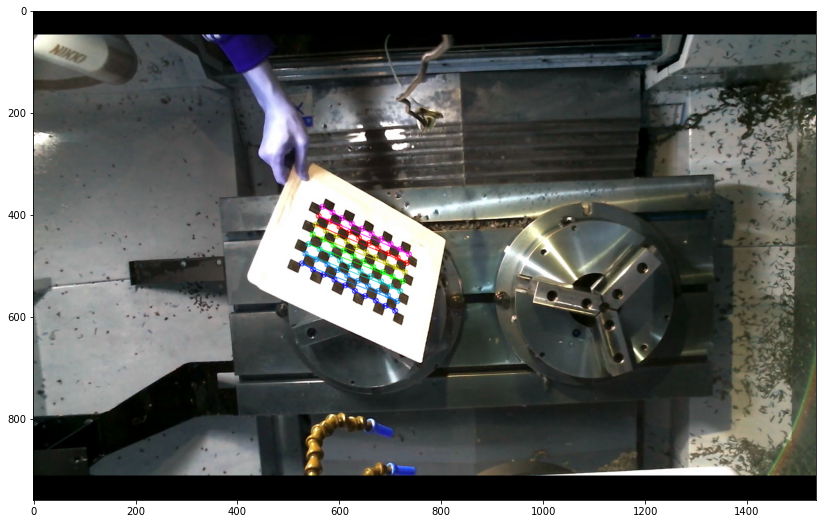

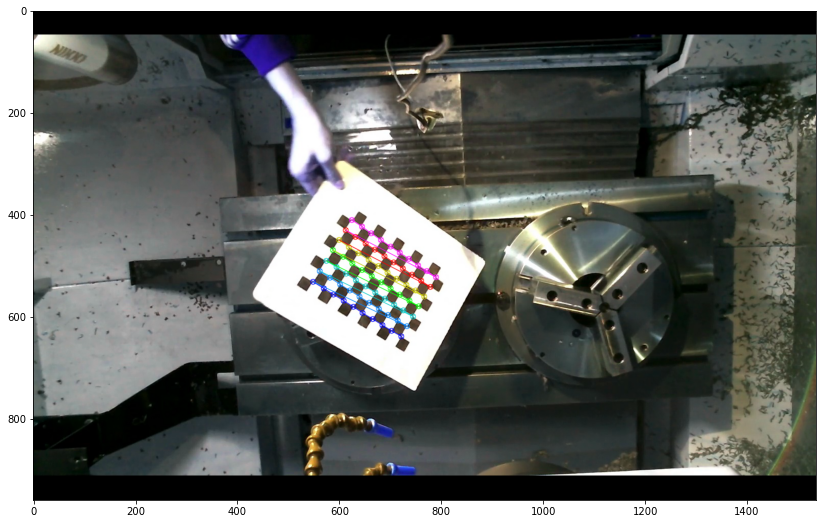

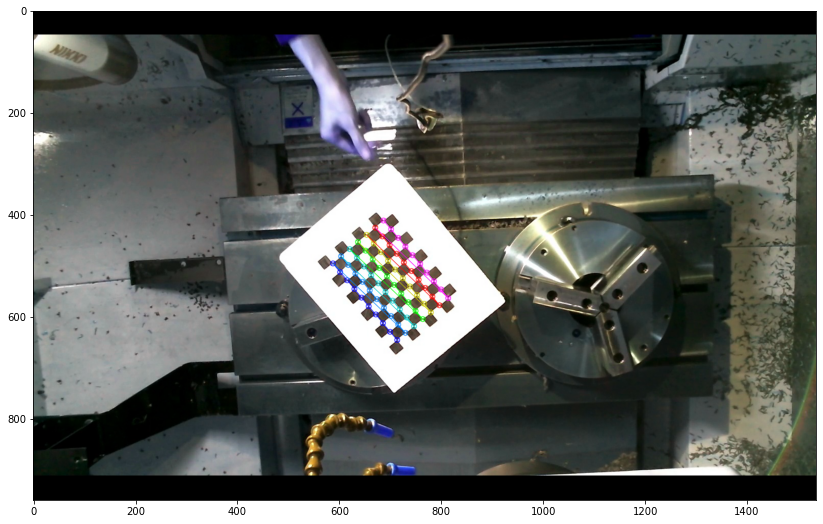

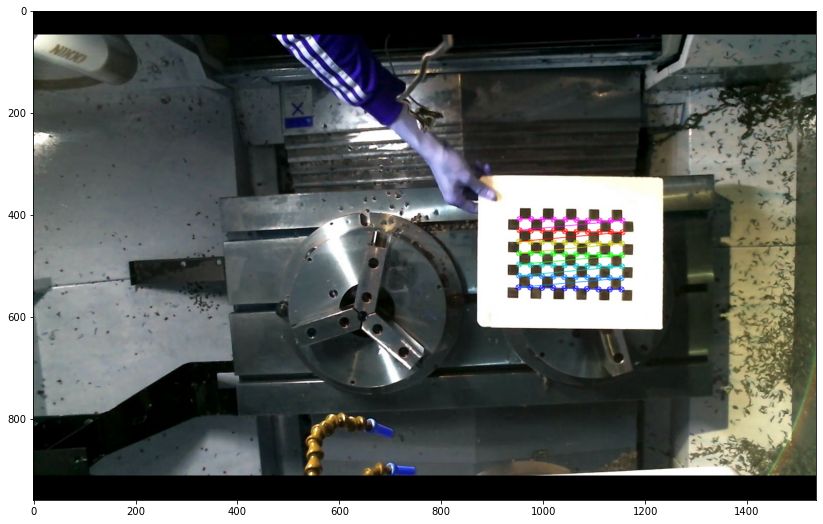

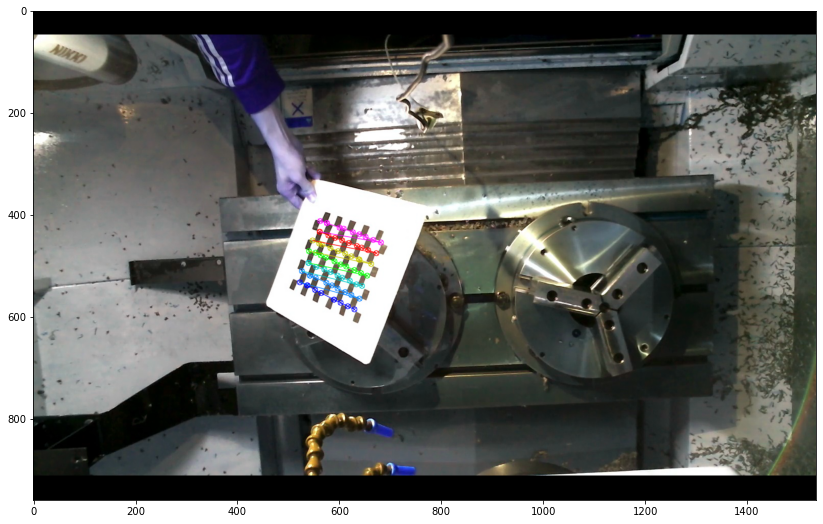

...

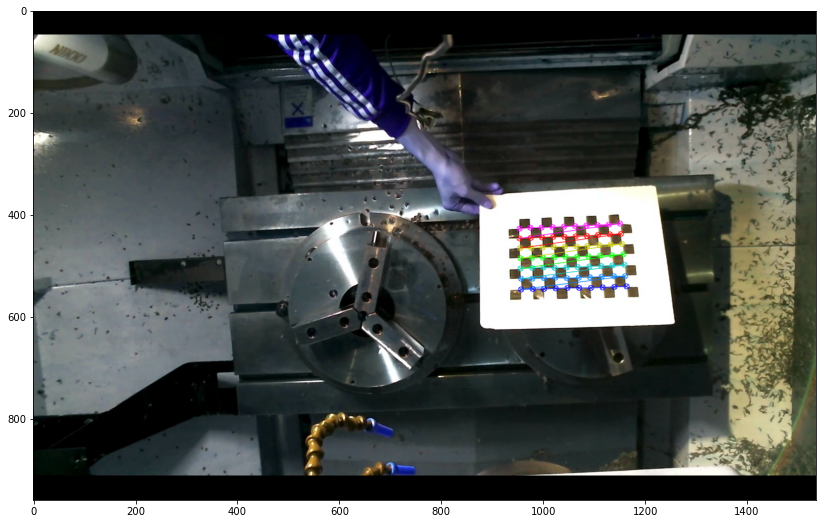

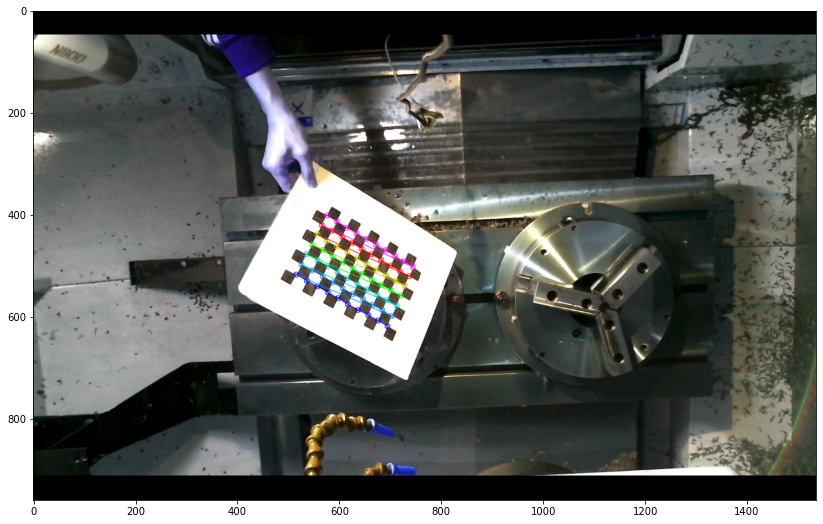

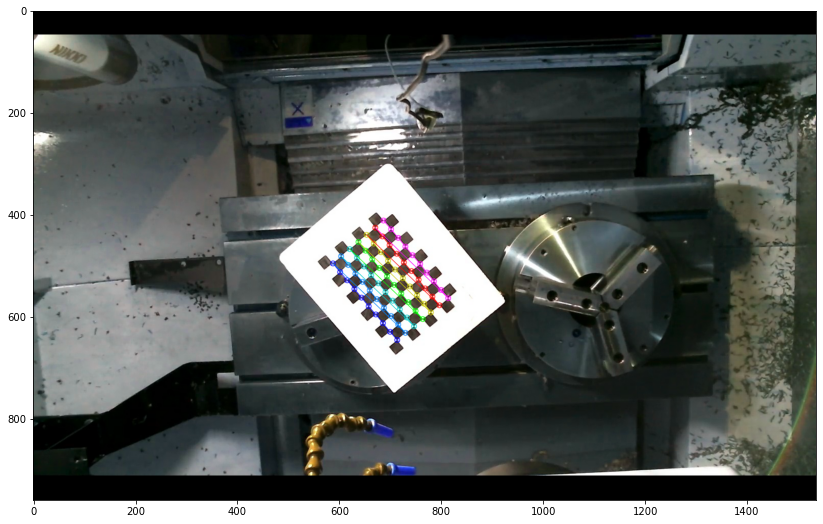

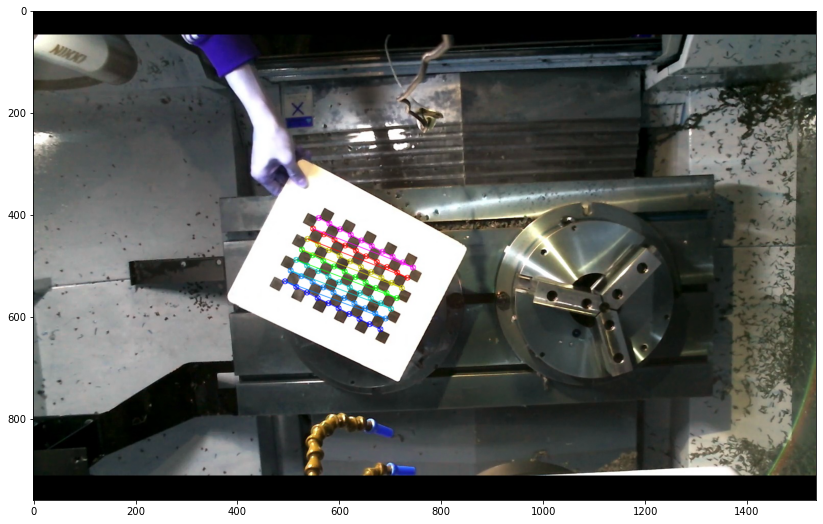

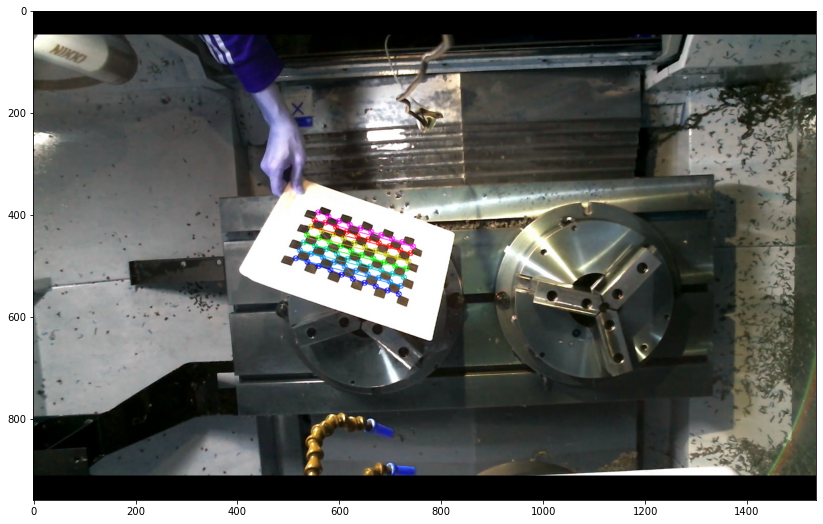

In [21]:
%matplotlib inline
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt

# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((7*10,3), np.float32)
objp[:,:2] = np.mgrid[0:10,0:7].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
images = glob.glob('data/calibration_images/*.jpg')
for fname in images:
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (10,7), None)
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)
        # Draw and display the corners
        cv.drawChessboardCorners(img, (10,7), corners2, ret)
        plt.figure(figsize=(15,9))
        plt.imshow(img)
        plt.show()
        


### Get Camera Matrix
- camera matrix is 3x3 matrix that maps 3d points to 2d points
- extrinsic parameters for each images are stored in `rvecs` and `tvecs`

In [24]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [31]:
# camera matrix
print(mtx)

[[1.28525577e+03 0.00000000e+00 7.99522674e+02]
 [0.00000000e+00 1.29031418e+03 4.74012375e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
